In [1]:
import pathlib
import numpy as np
import scipy as sp
import pandas as pd
from matplotlib import pyplot as plt


import statsmodels.api as sm
from statsmodels.formula.api import mixedlm, ols
import statsmodels.formula.api as smf
from astropy.stats import circcorrcoef
from statsmodels.stats.multitest import multipletests

import SessionTools.two_photon as st2p
import NeuromodPlasticity as nmp

plt.rcParams['pdf.fonttype']=42

%load_ext autoreload
%autoreload 2 

%matplotlib inline

In [2]:
basedir = pathlib.Path('/media/mplitt/SSD_storage/2P_scratch/R60D05LexA_jGCaMP7b_R18B05Gal4_TBHRNAi')
sess_df = pd.read_csv(basedir / 'sessions.csv')
print(sess_df.columns)
sess_df['fly_id'] = [row['date']+'_'+row['fly'] +'_' + row['gal4_line'] + '_' + row['rnai_line '] for _, row in sess_df.iterrows()]

figfolder = pathlib.Path('/media/mplitt/SSD_storage/fig_scratch/R60D05LexA_jGCaMP7b_R18B05Gal4_TBHRNAi/')
figfolder.mkdir(parents=True, exist_ok=True)

sess_df = sess_df.loc[sess_df['usable']==1]
sess_df = sess_df.loc[~((sess_df['closed_loop']==0) * (sess_df['dark']==0))]

sess_df = sess_df.loc[sess_df['rnai_line '] != 'rnai_76062']

rnai = []
for _, row in sess_df.iterrows():
    if row['gal4_line']!='control':
        rnai.append(row['rnai_line '])
    else:
        rnai.append('gal4_control')
sess_df['rnai']=rnai


Index(['date', 'fly', 'sess', 'fictrac_scan_num', 'closed_loop', 'dark',
       'rnai_line ', 'gal4_line', 'usable', 'fictrac_dat_file', 'notes'],
      dtype='object')


In [3]:
sess_df.head()

,date,fly,sess,fictrac_scan_num,closed_loop,dark,rnai_line,gal4_line,usable,fictrac_dat_file,notes,fly_id,rnai
0,29_03_2024,fly2,closed_loop-000,0,1,0,rnai_67968,R18B05,1,fictrac-20240329_135950.dat,NaN,29_03_2024_fly2_R18B05_rnai_67968,rnai_67968
1,29_03_2024,fly2,dark-001,1,0,1,rnai_67968,R18B05,1,fictrac-20240329_135950.dat,NaN,29_03_2024_fly2_R18B05_rnai_67968,rnai_67968
2,29_03_2024,fly2,closed_loop-002,2,2,0,rnai_67968,R18B05,1,fictrac-20240329_135950.dat,NaN,29_03_2024_fly2_R18B05_rnai_67968,rnai_67968
3,29_03_2024,fly2,dark-003,3,0,1,rnai_67968,R18B05,1,fictrac-20240329_135950.dat,NaN,29_03_2024_fly2_R18B05_rnai_67968,rnai_67968
5,01_04_2024,fly1,closed_loop-000,0,1,0,rnai_67968,R18B05,1,fictrac-20240401_162130.dat,NaN,01_04_2024_fly1_R18B05_rnai_67968,rnai_67968


In [4]:
def load_row(row):
    outdir = pathlib.PurePath( basedir / row['rnai'] / row['date'] / row['fly'] / row['sess'] / 'preprocess.pkl')
    return st2p.preprocessing.EBImagingSession.from_file(outdir)
        
    

In [5]:
stats_df = nmp.tbh_rnai.offset_stats(sess_df, load_row)
stats_df_unique = nmp.tbh_rnai.offset_stats_unique(stats_df)
stats_df_plot = nmp.tbh_rnai.offset_stats_plot(stats_df_unique)

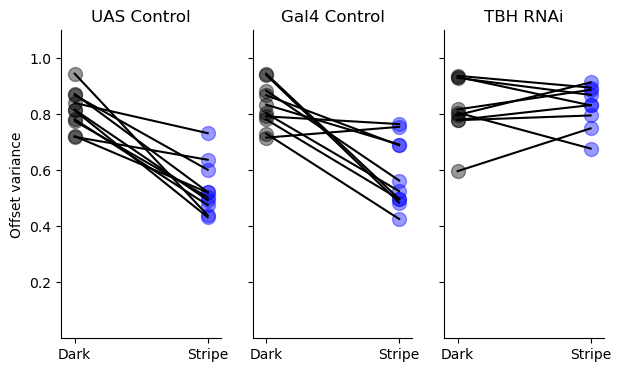

In [6]:
fig,ax = plt.subplots(1,3,sharey=True, figsize=[7,4])

c_df = stats_df_plot.loc[stats_df_plot['rnai']=='control']
ax[0].set_title('UAS Control')
ax[0].plot([0,1], c_df[['offset_var_dark', 'offset_var_closed_loop']].T, color='black')
ax[0].scatter(np.zeros((c_df.shape[0],)), c_df['offset_var_dark'], color='black', alpha=.4, s=100)
ax[0].scatter(np.ones((c_df.shape[0],)), c_df['offset_var_closed_loop'], color='blue', alpha=.4, s=100)

gal4_df = stats_df_plot.loc[stats_df_plot['rnai']=='gal4_control']
ax[1].set_title('Gal4 Control')
ax[1].plot([0,1], gal4_df[['offset_var_dark', 'offset_var_closed_loop']].T, color='black')
ax[1].scatter(np.zeros((gal4_df.shape[0],)), gal4_df['offset_var_dark'], color='black', alpha=.4, s=100)
ax[1].scatter(np.ones((gal4_df.shape[0],)), gal4_df['offset_var_closed_loop'], color='blue', alpha=.4, s=100)

tbh_df = stats_df_plot.loc[stats_df_plot['rnai']=='rnai_67968']
ax[2].set_title('TBH RNAi')
ax[2].plot([0,1], tbh_df[['offset_var_dark', 'offset_var_closed_loop']].T, color='black')
ax[2].scatter(np.zeros((tbh_df.shape[0],)), tbh_df['offset_var_dark'], color='black', alpha=.4, s=100)
ax[2].scatter(np.ones((tbh_df.shape[0],)), tbh_df['offset_var_closed_loop'], color='blue', alpha=.4, s=100)


for _ax in ax:
    _ax.set_ylim([0.0,1.1])
    _ax.set_xlim([-.1,1.1])
    _ax.set_yticks([.2,.4,.6,.8,1.])

    _ax.set_xticks([0, 1], labels=['Dark', 'Stripe'])
    _ax.spines['top'].set_visible(False)
    _ax.spines['right'].set_visible(False)
    
ax[0].set_ylabel('Offset variance')


fig.savefig(figfolder / 'offset_var_summary.pdf', format='pdf')

In [7]:
from pingouin import mixed_anova, pairwise_tests
aov = mixed_anova(dv='offset_var', between='rnai',
                  within='dark', subject='fly_id', data=stats_df_unique.loc[stats_df_unique['rnai']!='rnai_76062'])
aov

,Source,SS,DF1,DF2,MS,F,p-unc,np2,eps
0,rnai,0.225126,2,26,0.112563,12.784461,1.360219e-04,0.495820,NaN
1,dark,0.452167,1,26,0.452167,51.073027,1.370778e-07,0.662658,1.0
2,Interaction,0.227347,2,26,0.113674,12.839619,1.322952e-04,0.496897,NaN


In [8]:
tt = pairwise_tests(dv='offset_var', between='rnai',
                   subject='fly_id', within='dark', data=stats_df_unique.loc[stats_df_unique['rnai']!='rnai_76062'],
                   padjust='holm', parametric=True, interaction=True, within_first=False)

print(tt['Contrast'].unique())
tt

['rnai' 'dark' 'rnai * dark']


,Contrast,rnai,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,rnai,-,control,gal4_control,False,True,-1.270863,18.000000,two-sided,0.219957,0.219957,holm,0.694,-0.544333
1,rnai,-,control,rnai_67968,False,True,-4.697458,13.877391,two-sided,0.000351,0.001053,holm,106.539,-2.104718
2,rnai,-,gal4_control,rnai_67968,False,True,-3.412352,15.478184,two-sided,0.003713,0.007425,holm,11.766,-1.514824
3,dark,-,0,1,True,True,-5.260376,28.000000,two-sided,0.000014,NaN,NaN,1600.109,-1.365462
4,rnai * dark,control,0,1,True,True,-6.990045,9.000000,two-sided,0.000064,0.000192,holm,418.4,-3.221067
5,rnai * dark,gal4_control,0,1,True,True,-4.652816,9.000000,two-sided,0.001197,0.002395,holm,35.171,-2.209237
6,rnai * dark,rnai_67968,0,1,True,True,0.260193,8.000000,two-sided,0.801286,0.801286,holm,0.331,0.086512


In [9]:
tt = pairwise_tests(dv='offset_var', between='rnai',
                   subject='fly_id', within='dark', data=stats_df_unique.loc[stats_df_unique['rnai']!='rnai_76062'],
                   padjust='holm', parametric=True, interaction=True, within_first=True)

print(tt['Contrast'].unique())
tt

['dark' 'rnai' 'dark * rnai']


,Contrast,dark,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,dark,-,0,1,True,True,-5.260376,28.000000,two-sided,0.000014,NaN,NaN,1600.109,-1.365462
1,rnai,-,control,gal4_control,False,True,-1.270863,18.000000,two-sided,0.219957,0.219957,holm,0.694,-0.544333
2,rnai,-,control,rnai_67968,False,True,-4.697458,13.877391,two-sided,0.000351,0.001053,holm,106.539,-2.104718
3,rnai,-,gal4_control,rnai_67968,False,True,-3.412352,15.478184,two-sided,0.003713,0.007425,holm,11.766,-1.514824
4,dark * rnai,0,control,gal4_control,False,True,-1.085510,18.000000,two-sided,0.292020,1.000000,holm,0.599,-0.464943
5,dark * rnai,0,control,rnai_67968,False,True,-7.436183,16.845075,two-sided,0.000001,0.000006,holm,1.085e+04,-3.226560
6,dark * rnai,0,gal4_control,rnai_67968,False,True,-5.101555,15.186585,two-sided,0.000125,0.000626,holm,216.109,-2.184036
7,dark * rnai,1,control,gal4_control,False,True,-0.423920,18.000000,two-sided,0.676647,1.000000,holm,0.424,-0.181572
8,dark * rnai,1,control,rnai_67968,False,True,-0.097883,13.519684,two-sided,0.923462,1.000000,holm,0.406,-0.043941
9,dark * rnai,1,gal4_control,rnai_67968,False,True,0.230266,14.662470,two-sided,0.821067,1.000000,holm,0.412,0.102724


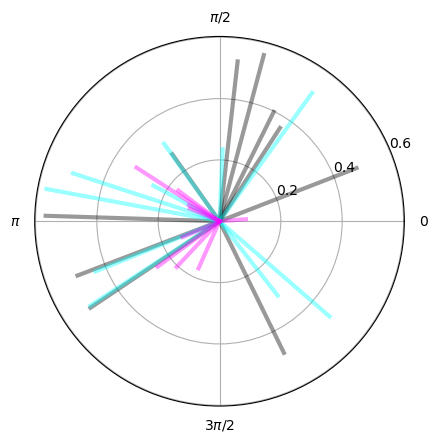

In [10]:


fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})

offsets = stats_df_unique.loc[(stats_df_unique['rnai']=='control') * (stats_df_unique['dark']==0),'offset_mean']-np.pi
mag = stats_df_unique.loc[(stats_df_unique['rnai']=='control') * (stats_df_unique['dark']==0),'offset_mag']

for i, (o,m) in enumerate(zip(offsets.tolist(),mag.tolist())):
    # print(o,m)
    ax.plot([o,o],[0,m], linewidth=3, color='black',alpha=.4)
    
offsets = stats_df_unique.loc[(stats_df_unique['rnai']=='gal4_control') * (stats_df_unique['dark']==0),'offset_mean']-np.pi
mag = stats_df_unique.loc[(stats_df_unique['rnai']=='gal4_control') * (stats_df_unique['dark']==0),'offset_mag']

for i, (o,m) in enumerate(zip(offsets.tolist(),mag.tolist())):
    # print(o,m)
    ax.plot([o,o],[0,m], linewidth=3, color='cyan', alpha=.4)

offsets = stats_df_unique.loc[(stats_df_unique['rnai']=='rnai_67968') * (stats_df_unique['dark']==0),'offset_mean']-np.pi
mag = stats_df_unique.loc[(stats_df_unique['rnai']=='rnai_67968') * (stats_df_unique['dark']==0),'offset_mag']

for i, (o,m) in enumerate(zip(offsets.tolist(),mag.tolist())):
    # print(o,m)
    ax.plot([o,o],[0,m], linewidth=3, color='magenta', alpha=.4)

    
_ = ax.set_rticks([.2, .4, .6])
_ = ax.set_xticks([0, np.pi/2, np.pi, 3*np.pi/2], ['0', r'$\pi$/2', r'$\pi$', r'3$\pi$/2'])
    

fig.savefig(figfolder / 'offset_hist_summary.pdf', format='pdf')

### Compare bump amplitude vs speed for all flies

In [11]:
dh_bins = np.linspace(.0, 3.14, num=20)

stats_df = nmp.tbh_rnai.rho_stats(sess_df, load_row, dh_bins=dh_bins)

stats_df = stats_df.loc[stats_df['cl']!=1] # exclude first closed loop session
stats_df.loc[stats_df['cl']>1, 'cl'] = 1 #
stats_df.loc[stats_df['dark']>=1, 'dark'] = 1 # 

grouped = stats_df.groupby(['fly_id','dark','rnai'])['rho_dig'].apply(lambda x: np.nanmean(np.stack(x),axis=0))
grouped = grouped.reset_index()

grouped.head()

/home/mplitt/repos/NeuromodPlasticity/NeuromodPlasticity/tbh_rnai.py:130: RuntimeWarning: Mean of empty slice.
  rho_dig = np.array([ts.rho[dh_dig == i].mean() for i in range(len(dh_bins))])
/home/mplitt/mambaforge/envs/NeuroModPlasticity/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/mplitt/repos/NeuromodPlasticity/NeuromodPlasticity/tbh_rnai.py:130: RuntimeWarning: Mean of empty slice.
  rho_dig = np.array([ts.rho[dh_dig == i].mean() for i in range(len(dh_bins))])
/home/mplitt/mambaforge/envs/NeuroModPlasticity/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/mplitt/repos/NeuromodPlasticity/NeuromodPlasticity/tbh_rnai.py:130: RuntimeWarning: Mean of empty slice.
  rho_dig = np.array([ts.rho[dh_dig == i].mean() for i in range(len(dh_bins))])
/home/mplitt/mambaforge/e

,fly_id,dark,rnai,rho_dig
0,01_04_2024_fly1_R18B05_rnai_67968,0,rnai_67968,"[0.2738833316907533, 0.35982719919602224, 0.42..."
1,01_04_2024_fly1_R18B05_rnai_67968,1,rnai_67968,"[0.3140097169649136, 0.5497883548578686, 0.564..."
2,02_04_2024_fly2_R18B05_control,0,control,"[0.353058483828786, 0.4425960855274335, 0.4494..."
3,02_04_2024_fly2_R18B05_control,1,control,"[0.32306706153681874, 0.34856676421803834, 0.3..."
4,03_04_2024_fly1_R18B05_rnai_67968,0,rnai_67968,"[0.18931778042946246, 0.20259827520221987, 0.2..."


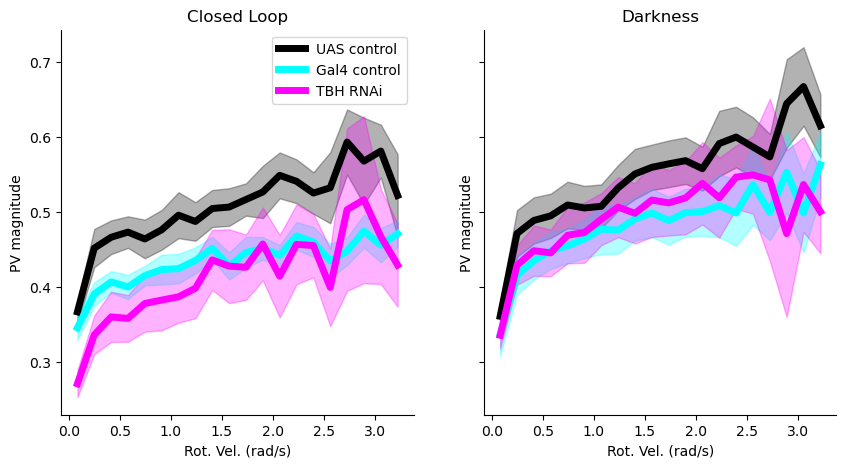

In [12]:
dh_bin_centers = dh_bins+np.diff(dh_bins)[0]/2
conditions = ('control','gal4_control', 'rnai_67968') 
rho_dict = {}
for cond in conditions:
    rho_dict[cond] = {'dark_rho':[],
                      'cl_rho':[]}

for fly in grouped['fly_id'].unique():
    if (grouped['fly_id']==fly).sum()>1:
        
        cond = grouped.loc[grouped['fly_id']==fly,'rnai'].iloc[0]
        
        dark_rho = grouped.loc[(grouped['fly_id']==fly) * (grouped['dark']==1), 'rho_dig']
        cl_rho = grouped.loc[(grouped['fly_id']==fly) * (grouped['dark']==0), 'rho_dig']
        
        
        rho_dict[cond]['dark_rho'].append(dark_rho.iloc[0])
        rho_dict[cond]['cl_rho'].append(cl_rho.iloc[0])

for cond in conditions:
    rho_dict[cond]['dark_rho'] = np.stack(rho_dict[cond]['dark_rho'])
    rho_dict[cond]['cl_rho'] = np.stack(rho_dict[cond]['cl_rho'])


fig, ax= plt.subplots(1,2, figsize=[10,5], sharey=True)
mu,sem = np.nanmean(rho_dict['control']['cl_rho'],axis=0), sp.stats.sem(rho_dict['control']['cl_rho'],axis=0,nan_policy='omit')
ax[0].plot(dh_bin_centers, mu, color='black', linewidth=5, label='UAS control')
ax[0].fill_between(dh_bin_centers, mu-sem, mu+sem, color='black', alpha=.3)


mu,sem = np.nanmean(rho_dict['gal4_control']['cl_rho'],axis=0), sp.stats.sem(rho_dict['gal4_control']['cl_rho'],axis=0,nan_policy='omit')
ax[0].plot(dh_bin_centers, mu, color='cyan', linewidth=5, label ='Gal4 control')
ax[0].fill_between(dh_bin_centers, mu-sem, mu+sem, color='cyan', alpha=.3)


mu,sem = np.nanmean(rho_dict['rnai_67968']['cl_rho'],axis=0), sp.stats.sem(rho_dict['rnai_67968']['cl_rho'],axis=0,nan_policy='omit')
ax[0].plot(dh_bin_centers, mu, color='magenta', linewidth=5, label = 'TBH RNAi')
ax[0].fill_between(dh_bin_centers, mu-sem, mu+sem, color='magenta', alpha=.3)


ax[0].legend()


mu,sem = np.nanmean(rho_dict['control']['dark_rho'],axis=0), sp.stats.sem(rho_dict['control']['dark_rho'],axis=0,nan_policy='omit')
ax[1].plot(dh_bin_centers, mu, color='black', linewidth=5)
ax[1].fill_between(dh_bin_centers, mu-sem, mu+sem, color='black', alpha=.3)


mu,sem = np.nanmean(rho_dict['gal4_control']['dark_rho'],axis=0), sp.stats.sem(rho_dict['gal4_control']['dark_rho'],axis=0,nan_policy='omit')
ax[1].plot(dh_bin_centers, mu, color='cyan', linewidth=5)
ax[1].fill_between(dh_bin_centers, mu-sem, mu+sem, color='cyan', alpha=.3)


mu,sem = np.nanmean(rho_dict['rnai_67968']['dark_rho'],axis=0), sp.stats.sem(rho_dict['rnai_67968']['cl_rho'],axis=0,nan_policy='omit')
ax[1].plot(dh_bin_centers, mu, color='magenta', linewidth=5)
ax[1].fill_between(dh_bin_centers, mu-sem, mu+sem, color='magenta', alpha=.3)



for a in ax:
    a.spines['top'].set_visible(False)
    a.spines['right'].set_visible(False)
    a.set_xlabel('Rot. Vel. (rad/s)')
    a.set_ylabel('PV magnitude')
ax[0].set_title('Closed Loop')
ax[1].set_title('Darkness')

fig.savefig(figfolder / 'PVMag_v_RotVel.pdf', format='pdf')
    

In [13]:
h,p = sp.stats.kruskal(np.nanmean(rho_dict['control']['cl_rho'],axis=-1), 
                       np.nanmean(rho_dict['gal4_control']['cl_rho'],axis=-1),
                            np.nanmean(rho_dict['rnai_67968']['cl_rho'], axis=-1))
print(h,p)

t,p = sp.stats.mannwhitneyu(np.nanmean(rho_dict['control']['cl_rho'],axis=-1), 
                            np.nanmean(rho_dict['rnai_67968']['cl_rho'], axis=-1))
print(t,p)

t,p = sp.stats.mannwhitneyu(np.nanmean(rho_dict['gal4_control']['cl_rho'],axis=-1), 
                            np.nanmean(rho_dict['rnai_67968']['cl_rho'], axis=-1))
print(t,p)


5.320197044334975 0.06994133063370636
60.0 0.08313908313908314
44.0 0.7618264088852323


In [14]:
h,p = sp.stats.kruskal(np.nanmean(rho_dict['control']['dark_rho'],axis=-1), 
                       np.nanmean(rho_dict['gal4_control']['dark_rho'],axis=-1),
                            np.nanmean(rho_dict['rnai_67968']['dark_rho'], axis=-1))
print(h,p)

t,p = sp.stats.mannwhitneyu(np.nanmean(rho_dict['control']['dark_rho'],axis=-1), 
                            np.nanmean(rho_dict['rnai_67968']['dark_rho'], axis=-1))
print(t,p)

t,p = sp.stats.mannwhitneyu(np.nanmean(rho_dict['gal4_control']['dark_rho'],axis=-1), 
                            np.nanmean(rho_dict['rnai_67968']['dark_rho'], axis=-1))
print(t,p)


1.8679802955664968 0.392982519485319
51.0 0.35993418346359524
37.0 0.8285570638511814


In [15]:
# reformat for regression
reg_df = nmp.tbh_rnai.reformat_rho_stats_for_reg(grouped, dh_bins)


In [16]:
from pingouin import mixed_anova, pairwise_tests
aov = mixed_anova(dv='rho', between='rnai',
                  within='dh', subject='fly_id', data=reg_df.loc[reg_df['dark']==0])
aov

,Source,SS,DF1,DF2,MS,F,p-unc,np2,eps
0,rnai,1.147406,2,22,0.573703,4.382650,2.500211e-02,0.284909,NaN
1,dh,0.856571,19,418,0.045083,17.771365,1.076251e-42,0.446838,0.274007
2,Interaction,0.129559,38,418,0.003409,1.343985,8.856811e-02,0.108878,NaN


In [17]:
tt = pairwise_tests(dv='rho', between='rnai',
                   subject='fly_id', within='dh', data=reg_df.loc[reg_df['dark']==0],
                   padjust='holm', parametric=True, interaction=True, within_first=True)

print(tt['Contrast'].unique())
# tt
tt.loc[tt['Contrast']=='dh * rnai']

['dh' 'rnai' 'dh * rnai']


,Contrast,dh,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
193,dh * rnai,0.0,control,gal4_control,False,True,0.958230,16.772617,two-sided,0.351557,1.000000,holm,0.556,0.420675
194,dh * rnai,0.0,control,rnai_67968,False,True,3.561669,9.969945,two-sided,0.005191,0.311475,holm,11.124,1.810167
195,dh * rnai,0.0,gal4_control,rnai_67968,False,True,2.839200,9.658487,two-sided,0.018156,0.945218,holm,4.268,1.430517
196,dh * rnai,0.165263,control,gal4_control,False,True,1.907776,12.628602,two-sided,0.079416,1.000000,holm,1.339,0.860510
197,dh * rnai,0.165263,control,rnai_67968,False,True,3.256754,11.996434,two-sided,0.006872,0.405467,holm,7.248,1.563939
198,dh * rnai,0.165263,gal4_control,rnai_67968,False,True,2.139138,7.837420,two-sided,0.065567,1.000000,holm,1.744,1.152961
199,dh * rnai,0.330526,control,gal4_control,False,True,2.126082,12.860904,two-sided,0.053449,1.000000,holm,1.749,0.957790
200,dh * rnai,0.330526,control,rnai_67968,False,True,3.024606,9.596809,two-sided,0.013382,0.736017,holm,5.271,1.553027
201,dh * rnai,0.330526,gal4_control,rnai_67968,False,True,1.841460,6.610873,two-sided,0.110601,1.000000,holm,1.25,1.054307
202,dh * rnai,0.495789,control,gal4_control,False,True,2.656508,14.555354,two-sided,0.018311,0.945218,holm,3.616,1.185820


In [18]:
tt = pairwise_tests(dv='rho', between='rnai',
                   subject='fly_id', within='dh', data=reg_df.loc[reg_df['dark']==0],
                   padjust='holm', parametric=True, interaction=True, within_first=False)

tt

,Contrast,rnai,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,rnai,-,control,gal4_control,False,True,2.420100,12.004915,two-sided,3.230398e-02,0.096912,holm,2.583,1.095260
1,rnai,-,control,rnai_67968,False,True,2.196236,8.773607,two-sided,5.643430e-02,0.112869,holm,1.844,1.154621
2,rnai,-,gal4_control,rnai_67968,False,True,0.856470,6.023182,two-sided,4.244957e-01,0.424496,holm,0.556,0.508611
3,dh,-,0.0,0.165263,True,True,-7.267604,24.000000,two-sided,1.653176e-07,0.000028,holm,9.442e+04,-0.796394
4,dh,-,0.0,0.330526,True,True,-8.627937,24.000000,two-sided,8.075333e-09,0.000001,holm,1.574e+06,-1.017748
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
758,rnai * dh,rnai_67968,2.644211,2.974737,True,True,-1.704839,5.000000,two-sided,1.489447e-01,1.000000,holm,0.964,-0.511069
759,rnai * dh,rnai_67968,2.644211,3.14,True,True,-0.543440,5.000000,two-sided,6.101689e-01,1.000000,holm,0.421,-0.096834
760,rnai * dh,rnai_67968,2.809474,2.974737,True,True,-0.023144,5.000000,two-sided,9.824308e-01,1.000000,holm,0.373,-0.004834
761,rnai * dh,rnai_67968,2.809474,3.14,True,True,1.348070,5.000000,two-sided,2.354861e-01,1.000000,holm,0.712,0.337526


In [19]:
tt = pairwise_tests(dv='rho', between='rnai',
                   subject='fly_id', within='dark', data=reg_df,
                   padjust='holm', parametric=True, interaction=True, within_first=False)

tt

,Contrast,rnai,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,rnai,-,control,gal4_control,False,True,1.996964,18.000000,two-sided,0.061177,0.183532,holm,1.492,0.855334
1,rnai,-,control,rnai_67968,False,True,1.482326,12.383049,two-sided,0.163250,0.326500,holm,0.858,0.695043
2,rnai,-,gal4_control,rnai_67968,False,True,0.106964,10.570465,two-sided,0.916820,0.916820,holm,0.415,0.051323
3,dark,-,0,1,True,True,-4.474144,27.000000,two-sided,0.000125,NaN,NaN,215.125,-0.541754
4,rnai * dark,control,0,1,True,True,-2.780456,9.000000,two-sided,0.021385,0.042770,holm,3.393,-0.446339
5,rnai * dark,gal4_control,0,1,True,True,-1.892817,9.000000,two-sided,0.090926,0.090926,holm,1.131,-0.588480
6,rnai * dark,rnai_67968,0,1,True,True,-3.600511,7.000000,two-sided,0.008734,0.026202,holm,7.264,-0.607283


Correlation of bump movement with turning in darkness vs closed loop


In [20]:
dh_bins = np.linspace(-2, 2, num=20)
stats_df = nmp.tbh_rnai.dphi_stats(sess_df, load_row, dh_bins)


stats_df = stats_df.loc[stats_df['cl']!=1] # exclude first closed loop session
stats_df.loc[stats_df['cl']>1, 'cl'] = 1 #
stats_df.loc[stats_df['dark']>=1, 'dark'] = 1 # 

grouped = stats_df.groupby(['fly_id','dark','rnai'])['dphi_dig'].apply(lambda x: np.nanmean(np.stack(x),axis=0))

grouped = grouped.reset_index()
    


/home/mplitt/repos/NeuromodPlasticity/NeuromodPlasticity/tbh_rnai.py:191: RuntimeWarning: Mean of empty slice.
  dphi_dig = np.array([d_phi[dh_dig == i].mean() for i in range(len(dh_bins))])
/home/mplitt/mambaforge/envs/NeuroModPlasticity/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/mplitt/repos/NeuromodPlasticity/NeuromodPlasticity/tbh_rnai.py:191: RuntimeWarning: Mean of empty slice.
  dphi_dig = np.array([d_phi[dh_dig == i].mean() for i in range(len(dh_bins))])
/home/mplitt/mambaforge/envs/NeuroModPlasticity/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/mplitt/repos/NeuromodPlasticity/NeuromodPlasticity/tbh_rnai.py:191: RuntimeWarning: Mean of empty slice.
  dphi_dig = np.array([d_phi[dh_dig == i].mean() for i in range(len(dh_bins))])
/home/mplitt/mambaforge/e

control
gal4_control
rnai_67968


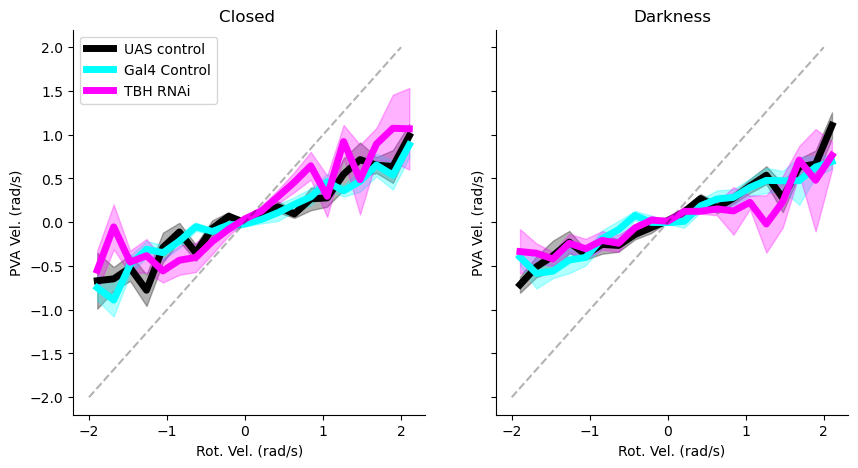

In [21]:
dh_bin_centers = dh_bins+np.diff(dh_bins)[0]/2
conditions = ('control','gal4_control', 'rnai_67968') 
dphi_dict = {}
for cond in conditions:
    dphi_dict[cond] = {'dark_dphi':[],
                      'cl_dphi':[]}

for fly in grouped['fly_id'].unique():
    if (grouped['fly_id']==fly).sum()>1:
        
        cond = grouped.loc[grouped['fly_id']==fly,'rnai'].iloc[0]
        
        dark_dphi = grouped.loc[(grouped['fly_id']==fly) * (grouped['dark']==1), 'dphi_dig']
        cl_dphi = grouped.loc[(grouped['fly_id']==fly) * (grouped['dark']==0), 'dphi_dig']
        
        dphi_dict[cond]['dark_dphi'].append(dark_dphi.iloc[0])
        dphi_dict[cond]['cl_dphi'].append(cl_dphi.iloc[0])
        
for cond in conditions:
    print(cond)
    dphi_dict[cond]['dark_dphi'] = np.stack(dphi_dict[cond]['dark_dphi'])
    dphi_dict[cond]['cl_dphi'] = np.stack(dphi_dict[cond]['cl_dphi'])


fig, ax= plt.subplots(1,2, figsize=[10,5], sharey=True)
mu,sem = np.nanmean(dphi_dict['control']['cl_dphi'],axis=0), sp.stats.sem(dphi_dict['control']['cl_dphi'],axis=0,nan_policy='omit')
ax[0].plot(dh_bin_centers, mu, color='black', linewidth=5, label='UAS control')
ax[0].fill_between(dh_bin_centers, mu-sem, mu+sem, color='black', alpha=.3)


mu,sem = np.nanmean(dphi_dict['gal4_control']['cl_dphi'],axis=0), sp.stats.sem(dphi_dict['gal4_control']['cl_dphi'],axis=0,nan_policy='omit')
ax[0].plot(dh_bin_centers, mu, color='cyan', linewidth=5, label='Gal4 Control')
ax[0].fill_between(dh_bin_centers, mu-sem, mu+sem, color='cyan', alpha=.3)


mu,sem = np.nanmean(dphi_dict['rnai_67968']['cl_dphi'],axis=0), sp.stats.sem(dphi_dict['rnai_67968']['cl_dphi'],axis=0,nan_policy='omit')
ax[0].plot(dh_bin_centers, mu, color='magenta', linewidth=5, label='TBH RNAi')
ax[0].fill_between(dh_bin_centers, mu-sem, mu+sem, color='magenta', alpha=.3)

ax[0].legend()

mu,sem = np.nanmean(dphi_dict['control']['dark_dphi'],axis=0), sp.stats.sem(dphi_dict['control']['dark_dphi'],axis=0,nan_policy='omit')
ax[1].plot(dh_bin_centers, mu, color='black', linewidth=5)
ax[1].fill_between(dh_bin_centers, mu-sem, mu+sem, color='black', alpha=.3)


mu,sem = np.nanmean(dphi_dict['gal4_control']['dark_dphi'],axis=0), sp.stats.sem(dphi_dict['gal4_control']['dark_dphi'],axis=0,nan_policy='omit')
ax[1].plot(dh_bin_centers, mu, color='cyan', linewidth=5)
ax[1].fill_between(dh_bin_centers, mu-sem, mu+sem, color='cyan', alpha=.3)


mu,sem = np.nanmean(dphi_dict['rnai_67968']['dark_dphi'],axis=0), sp.stats.sem(dphi_dict['rnai_67968']['dark_dphi'],axis=0,nan_policy='omit')
ax[1].plot(dh_bin_centers, mu, color='magenta', linewidth=5)
ax[1].fill_between(dh_bin_centers, mu-sem, mu+sem, color='magenta', alpha=.3)


for a in ax:
    
    a.plot([-2,2],[-2,2], 'k--', alpha=.3)
    # a.set_ylim([-1,1])
    # a.set_xlim([-1,1])
    a.spines['top'].set_visible(False)
    a.spines['right'].set_visible(False)
    a.set_xlabel('Rot. Vel. (rad/s)')
    a.set_ylabel('PVA Vel. (rad/s)')
    
ax[0].set_title('Closed ')
ax[1].set_title('Darkness')

fig.savefig(figfolder / 'dPVA_v_RotVel.pdf', format='pdf')
    
    
    


In [22]:
reg_df = nmp.tbh_rnai.reformat_dphi_stats_for_reg(grouped, dh_bins)



In [23]:
df = reg_df.loc[reg_df['dark']==0]
# model = mixedlm('dphi ~ C(rnai, Treatment("rnai_67968"))*dh', df, groups=df['fly_id'])
model = ols('dphi ~ C(rnai, Treatment("rnai_67968"))*dh', df)

result = model.fit()
print(result.summary())
print(result.pvalues)
intxns = ['C(rnai, Treatment("rnai_67968"))[T.control]:dh',
       'C(rnai, Treatment("rnai_67968"))[T.gal4_control]:dh']

intxn_pvals = [result.pvalues[k] for k in intxns]
print(multipletests(intxn_pvals , alpha=.05, method='holm'))


                            OLS Regression Results                            
Dep. Variable:                   dphi   R-squared:                       0.509
Model:                            OLS   Adj. R-squared:                  0.505
Method:                 Least Squares   F-statistic:                     114.5
Date:                Wed, 12 Feb 2025   Prob (F-statistic):           6.44e-83
Time:                        12:29:06   Log-Likelihood:                -360.60
No. Observations:                 558   AIC:                             733.2
Df Residuals:                     552   BIC:                             759.2
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

In [24]:
df = reg_df.loc[reg_df['dark']==1]
# model = mixedlm('dphi ~ C(rnai, Treatment("rnai_67968"))*dh', df, groups=df['fly_id'])
model = ols('dphi ~ C(rnai, Treatment("rnai_67968"))*dh', df)

result = model.fit()
print(result.summary())
print(result.pvalues)

intxns = ['C(rnai, Treatment("rnai_67968"))[T.control]:dh',
       'C(rnai, Treatment("rnai_67968"))[T.gal4_control]:dh']

intxn_pvals = [result.pvalues[k] for k in intxns]
print(multipletests(intxn_pvals , alpha=.05, method='holm'))

                            OLS Regression Results                            
Dep. Variable:                   dphi   R-squared:                       0.391
Model:                            OLS   Adj. R-squared:                  0.386
Method:                 Least Squares   F-statistic:                     78.73
Date:                Wed, 12 Feb 2025   Prob (F-statistic):           8.92e-64
Time:                        12:29:06   Log-Likelihood:                -423.99
No. Observations:                 620   AIC:                             860.0
Df Residuals:                     614   BIC:                             886.6
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

/home/mplitt/repos/NeuromodPlasticity/NeuromodPlasticity/tbh_rnai.py:275: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig_polar, ax_polar = plt.subplots(subplot_kw={'projection':'polar'})


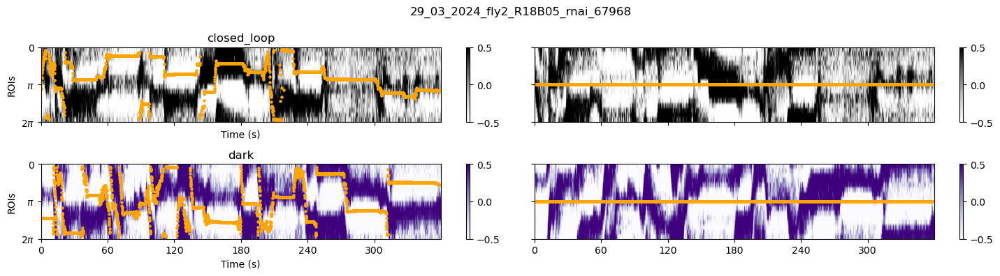

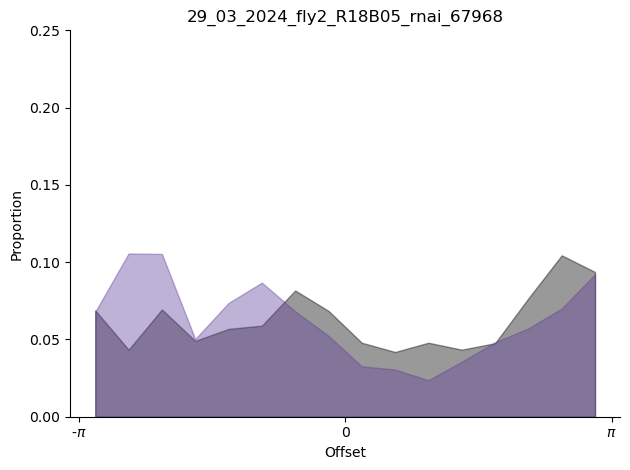

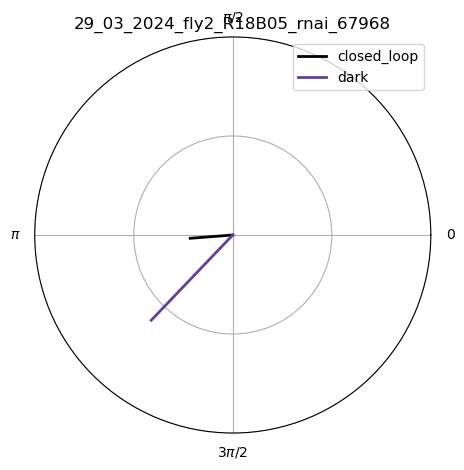

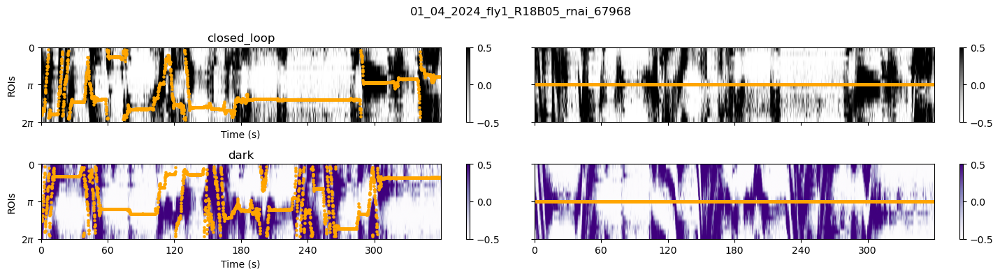

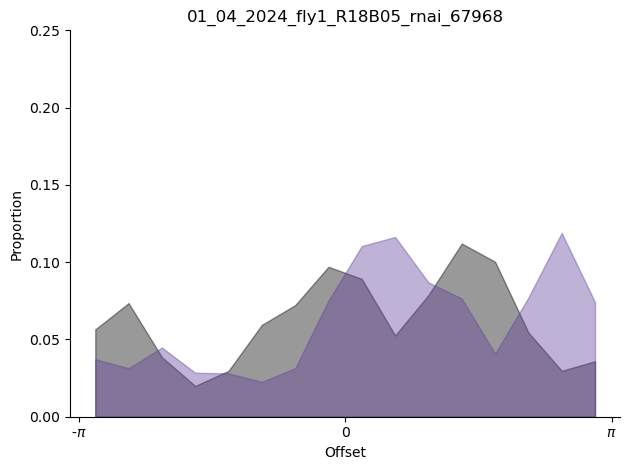

...

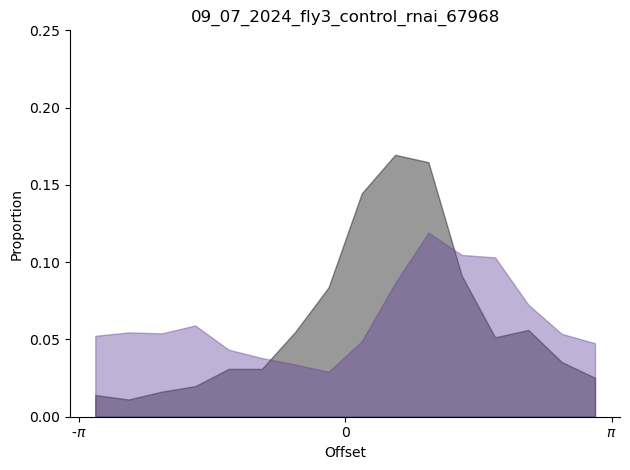

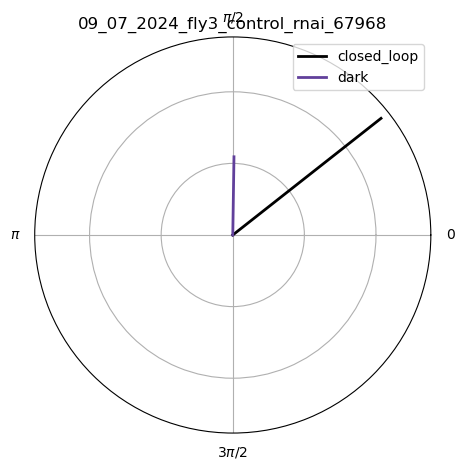

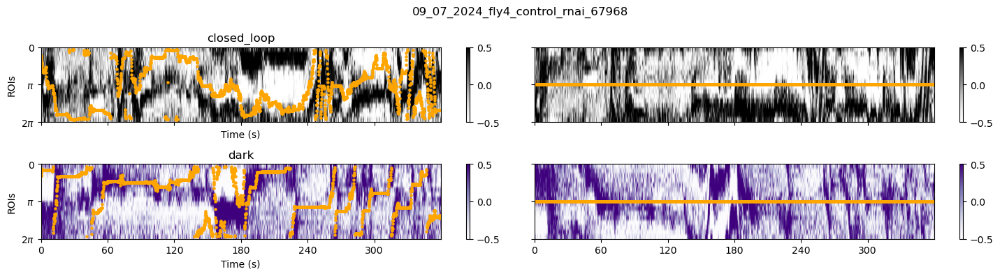

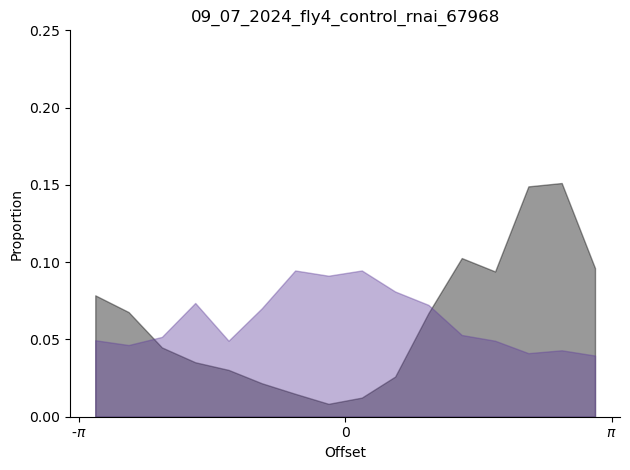

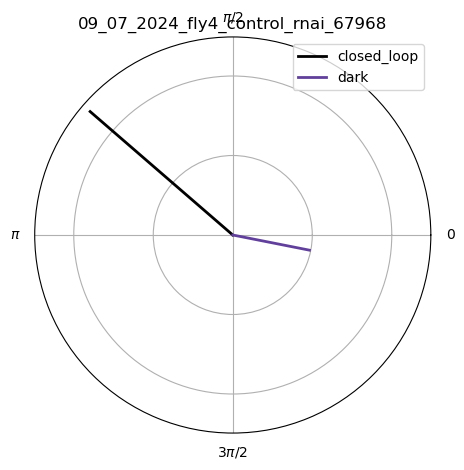

In [25]:
# plot each fly
session_folder = figfolder / "sessions"
session_folder.mkdir(parents=True, exist_ok=True)

flies = sess_df['fly_id'].unique()
for fly in flies:
    
    cl = sess_df.loc[(sess_df['fly_id']==fly) * (sess_df['closed_loop']>1)]
    dark = sess_df.loc[(sess_df['fly_id']==fly) * (sess_df['dark']==1)]
    
    if cl.shape[0]>0 and dark.shape[0]>0:
        
        ts_dict = {'fly': fly,
                   'closed_loop': nmp.session.GetTS(load_row(cl.iloc[0])),
                   'dark': nmp.session.GetTS(load_row(dark.iloc[0])),
        }
        
        fig_heatmaps, ax_heatmas = nmp.tbh_rnai.plot_sess_heatmaps(ts_dict)
        (fig_hist, ax_hist), (fig_polar, ax_polar) = nmp.tbh_rnai.plot_sess_histograms(ts_dict)
    
    
    fly_folder = session_folder / fly
    fly_folder.mkdir(parents=True, exist_ok=True)
    
    fig_heatmaps.savefig(fly_folder / "heatmaps.pdf")
    fig_hist.savefig(fly_folder / "offset_hist.pdf")
    fig_polar.savefig(fly_folder / "offset_polar.pdf")